# simple UMAP

/Users/oskarhaupt/Library/Python/3.9/lib/python/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


Original shape: (12315, 22037)


/Users/oskarhaupt/Library/Python/3.9/lib/python/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/Users/oskarhaupt/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/06/zfzddxwn4hd0ywccb30sl4qw0000gn/T/ipykernel_21190/1196124379.py:33: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(simple_adata, resolution=0.5)


Final shape: (12315, 22037)
Generated UMAP with minimal preprocessing


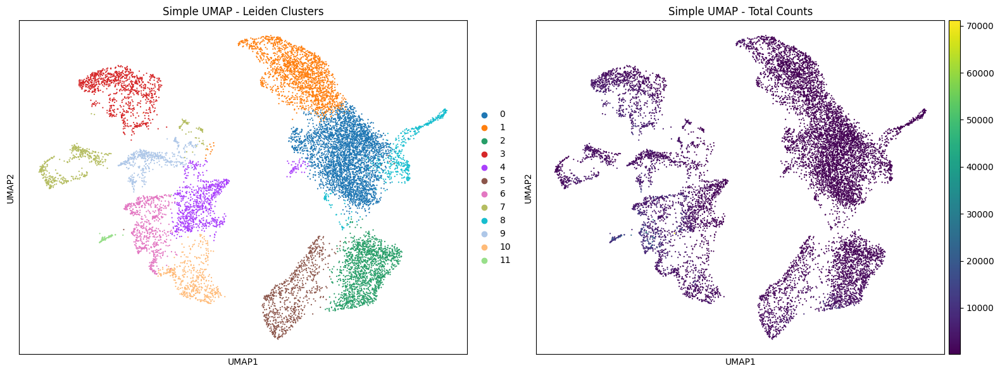


Available obs columns: ['cluster_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden']
Available markers: ['DMRT1', 'STRA8', 'SYCP1', 'SYCP3', 'PRM1', 'PRM2', 'TNP1', 'ACRV1']


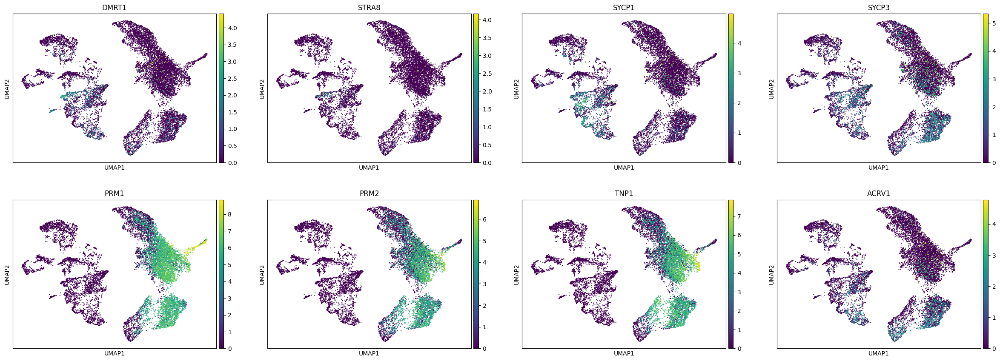

In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
# Simple UMAP for CellBender data - minimal preprocessing
filename = "56040_soupx_corrected_counts.h5ad"
simple_adata = sc.read_h5ad("/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/11_decontX/" + filename)

print(f"Original shape: {simple_adata.shape}")

# Minimal QC - just remove obvious empty cells
sc.pp.calculate_qc_metrics(simple_adata, inplace=True)

# Very basic filtering (optional - comment out if you want truly raw)
# sc.pp.filter_cells(simple_adata, min_genes=200)
# sc.pp.filter_genes(simple_adata, min_cells=3)

# Basic normalization
sc.pp.normalize_total(simple_adata, target_sum=1e4)
sc.pp.log1p(simple_adata)

# Use all genes or top variable genes (uncomment one approach)
# Option 1: Use ALL genes
sc.pp.pca(simple_adata, n_comps=50, use_highly_variable=False)

# Option 2: Select HVGs (less aggressive than your pipeline)
#sc.pp.highly_variable_genes(simple_adata, n_top_genes=3000)
#sc.pp.pca(simple_adata, n_comps=50)

# Generate UMAP
sc.pp.neighbors(simple_adata, n_neighbors=15, n_pcs=30)
sc.tl.umap(simple_adata, min_dist=0.3)

# Optional: add leiden clustering for coloring
sc.tl.leiden(simple_adata, resolution=0.5)

print(f"Final shape: {simple_adata.shape}")
print(f"Generated UMAP with minimal preprocessing")

# Visualize simple UMAP
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Color by leiden clusters
sc.pl.umap(simple_adata, color='leiden', ax=axes[0], show=False, title='Simple UMAP - Leiden Clusters')

# Color by total counts (QC metric)
sc.pl.umap(simple_adata, color='total_counts', ax=axes[1], show=False, title='Simple UMAP - Total Counts')

plt.tight_layout()
plt.show()

# Also check some marker genes if available
print("\nAvailable obs columns:", list(simple_adata.obs.columns))

# Optional: Check key spermatogenesis markers on simple UMAP
marker_genes = ['DMRT1', 'STRA8', 'SYCP1', 'SYCP3', 'PRM1', 'PRM2', 'TNP1', 'ACRV1']
available_markers = [gene for gene in marker_genes if gene in simple_adata.var_names]

print(f"Available markers: {available_markers}")

if len(available_markers) > 0:
    sc.pl.umap(simple_adata, color=available_markers, ncols=4, cmap='viridis')


# GSEA

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad

filename = "56040_soupx_corrected_counts.h5ad"
path = "/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/11_decontX/" + filename

soupx = sc.read_h5ad(filename)
soupx

AnnData object with n_obs × n_vars = 12315 × 22037
    obs: 'cluster_annotation'
    uns: 'X_name'

In [3]:
soupx.obs_names

Index(['AAACAGCCAATTGAGA-1', 'AAACAGCCACGCAACT-1', 'AAACAGCCAGTCTAGC-1',
       'AAACAGCCATCAGCAC-1', 'AAACATGCAAACATAG-1', 'AAACATGCAACCGCCA-1',
       'AAACATGCAAGATTCT-1', 'AAACATGCACAGCCTG-1', 'AAACATGCACCTATAG-1',
       'AAACATGCATTGCGGT-1',
       ...
       'TTTGTGTTCTATTGTC-1', 'TTTGTGTTCTTGCAGG-1', 'TTTGTTGGTCACAGAC-1',
       'TTTGTTGGTGCAACTA-1', 'TTTGTTGGTGCTTTAC-1', 'TTTGTTGGTGTCCAGG-1',
       'TTTGTTGGTTAGGTGC-1', 'TTTGTTGGTTAGGTTG-1', 'TTTGTTGGTTATTGCC-1',
       'TTTGTTGGTTGGTTAG-1'],
      dtype='object', length=12315)

In [ ]:
import sys
sys.path.insert(1, '/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_new')
from gene_pathway_analysis import SpermatogenesisAnalyzer # main file for GSEA analysis. creates h5ad file with GSEA processed data

Output directory created: 58_GSEA_soupX/GSEA_20251021_013247
Defined 29 trajectory markers of germ cells (5 categories)
Cell type markers: 62 total including leydig/sertoli etc
Original data shape: (12315, 22037)
Data loaded and QC metrics calculated


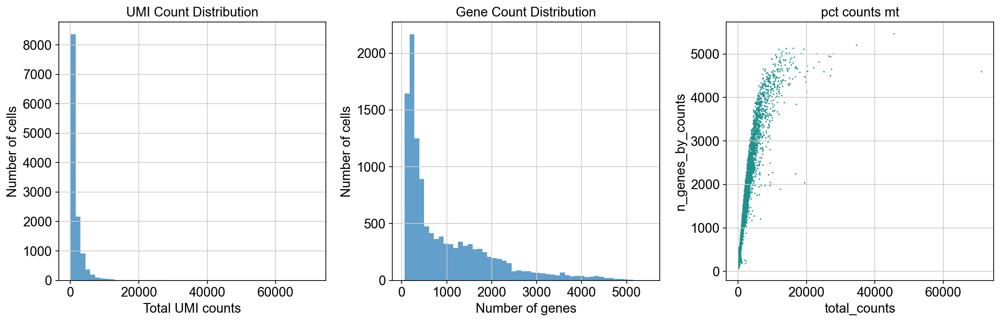


NORMALIZATION & SCALING
Parameters saved to: 58_GSEA_soupX/GSEA_20251021_013247/parameters.txt
NO custom hvg filter but just for your information:
There would be 5918 highly variable genes available

ADVANCED DIMENSIONALITY REDUCTION


Compute diffusion-based UMAP: 100%|██████████| 4/4 [00:30<00:00,  7.66s/step]



SPERMATOGENESIS TRAJECTORY INFERENCE
Root cluster set: 15

GSEA PATHWAY ANALYSIS
Progression groups: progression_group
EARLY    6712
LATE     5603
Name: count, dtype: int64
(1/1) Running GSEA with GO_Biological_Process_2023...
   -> 2425 pathways found

TOP PATHWAYS (first database):
                                                Term        ES       NES  \
0                   Cytosolic Transport (GO:0016482)  0.620748  2.646753   
1       Peptidyl-Serine Phosphorylation (GO:0018105)  0.619309  2.591058   
2            Regulation Of RNA Splicing (GO:0043484)  0.626208  2.579755   
3                       Phosphorylation (GO:0016310)  0.536436  2.576111   
4          Peptidyl-Serine Modification (GO:0018209)  0.599314  2.571869   
5  Regulation Of Small GTPase Mediated Signal Tra...  0.602101  2.564462   
6  Positive Regulation Of Developmental Process (...  0.547883  2.563836   
7               Protein Phosphorylation (GO:0006468)  0.540063  2.563665   
8                   Endosomal 

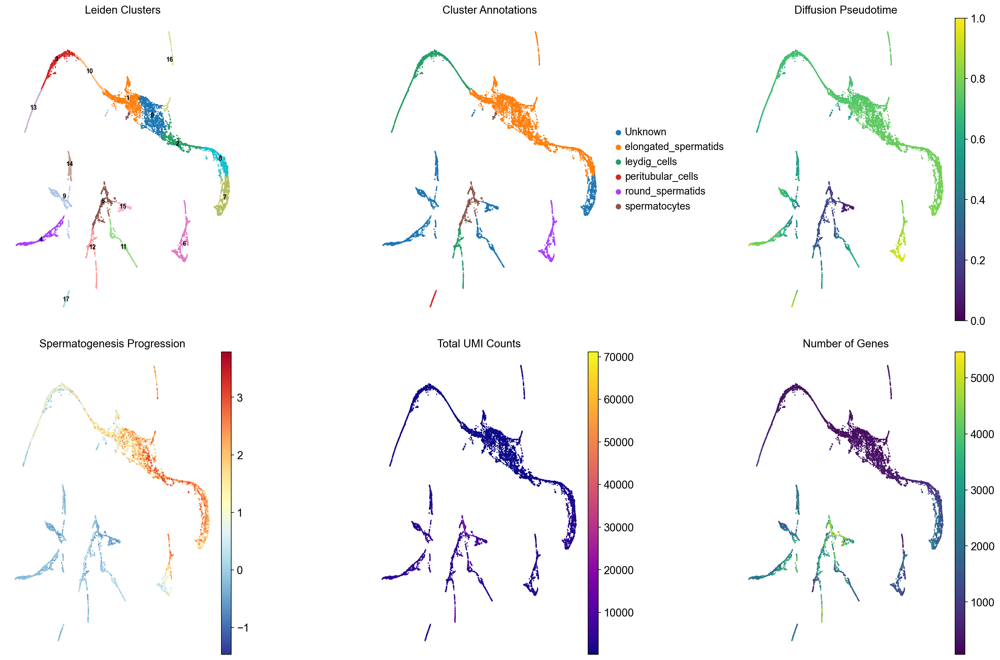


Creating cluster-specific marker plots...


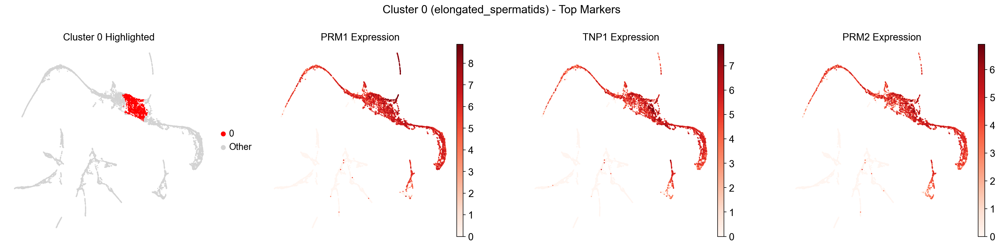

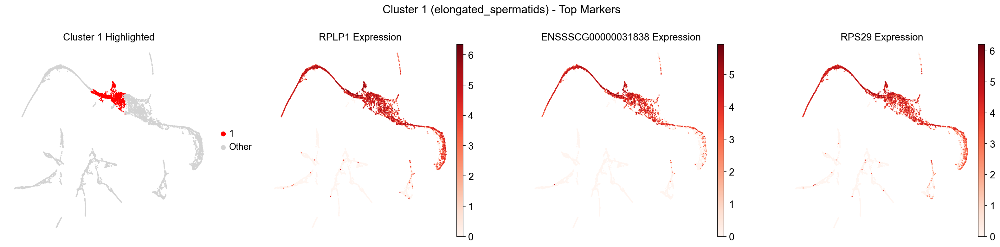

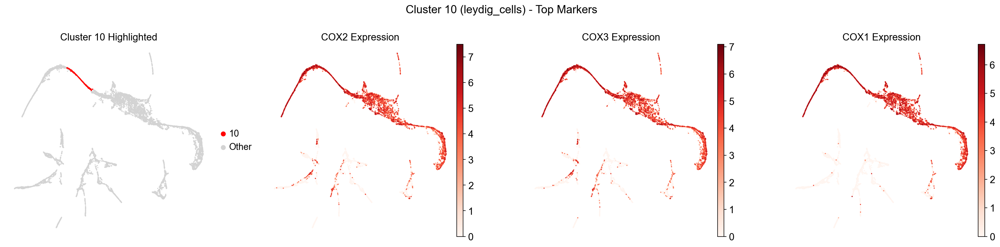

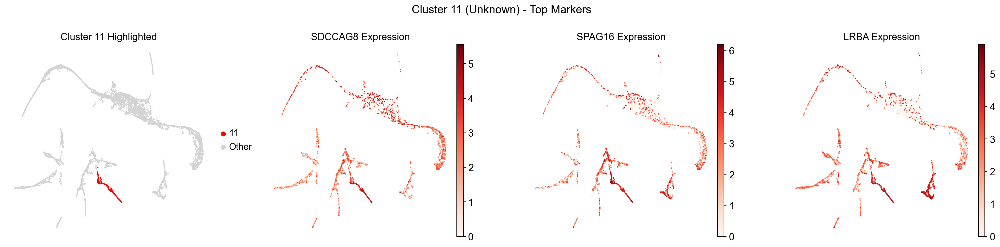

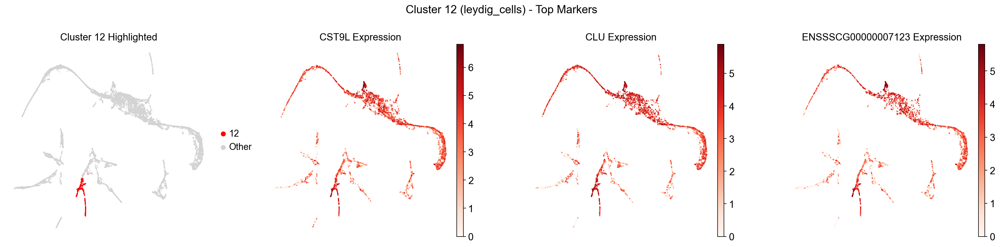

...

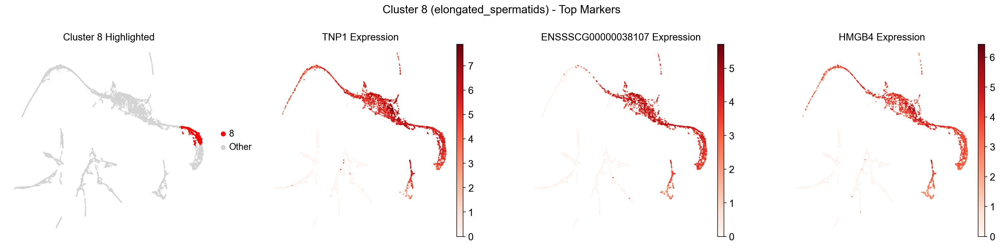

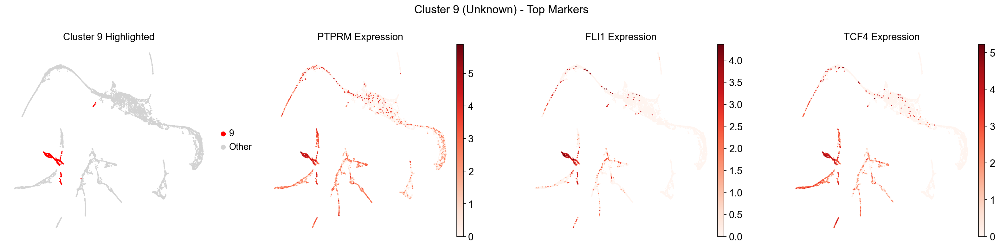

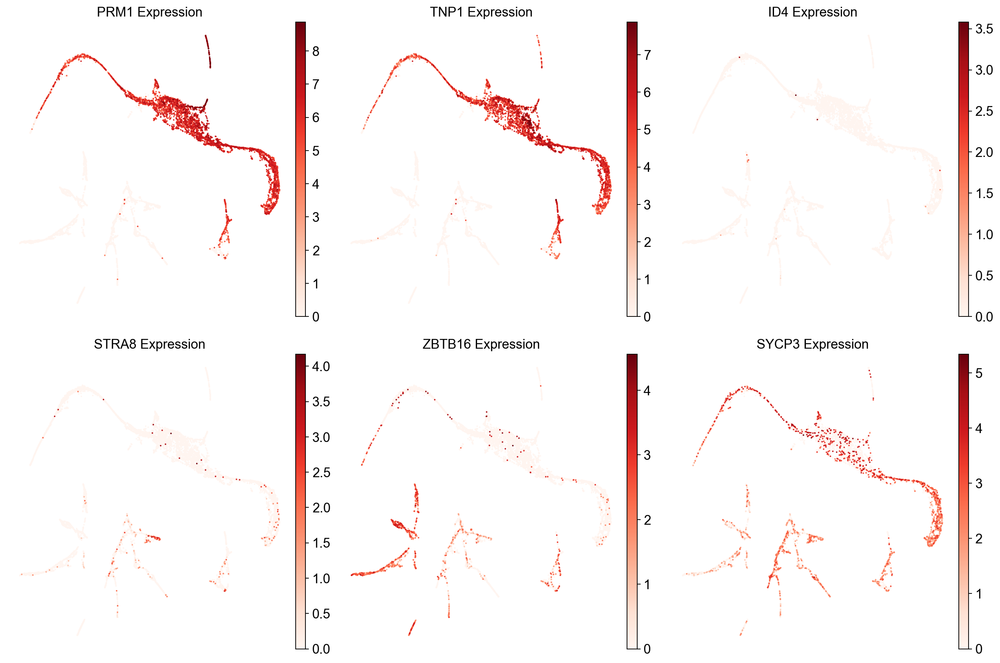

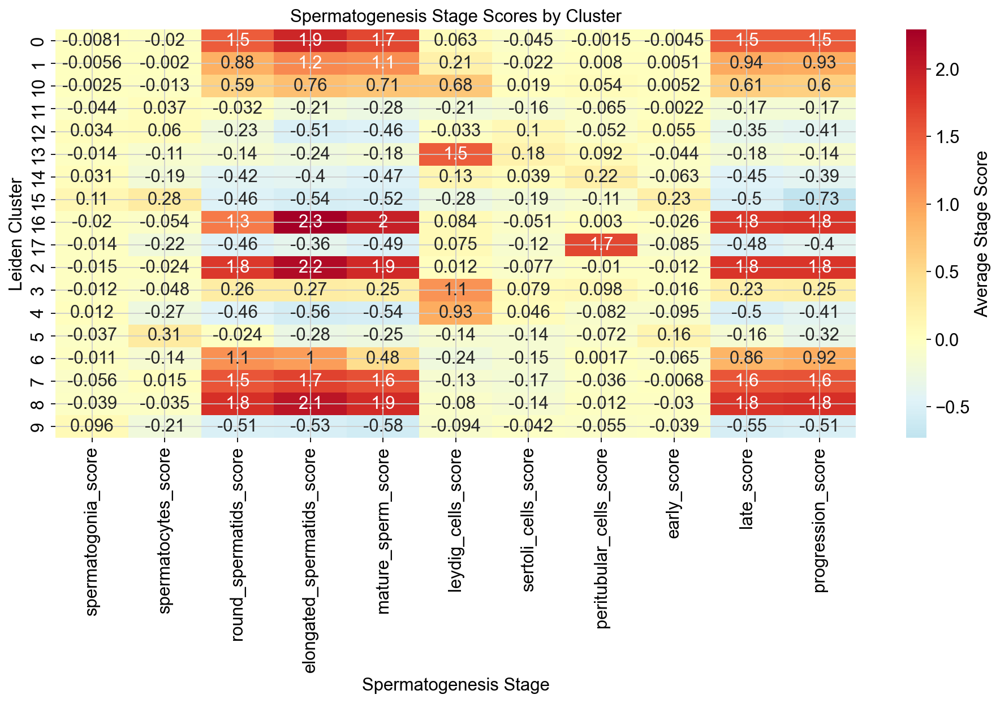

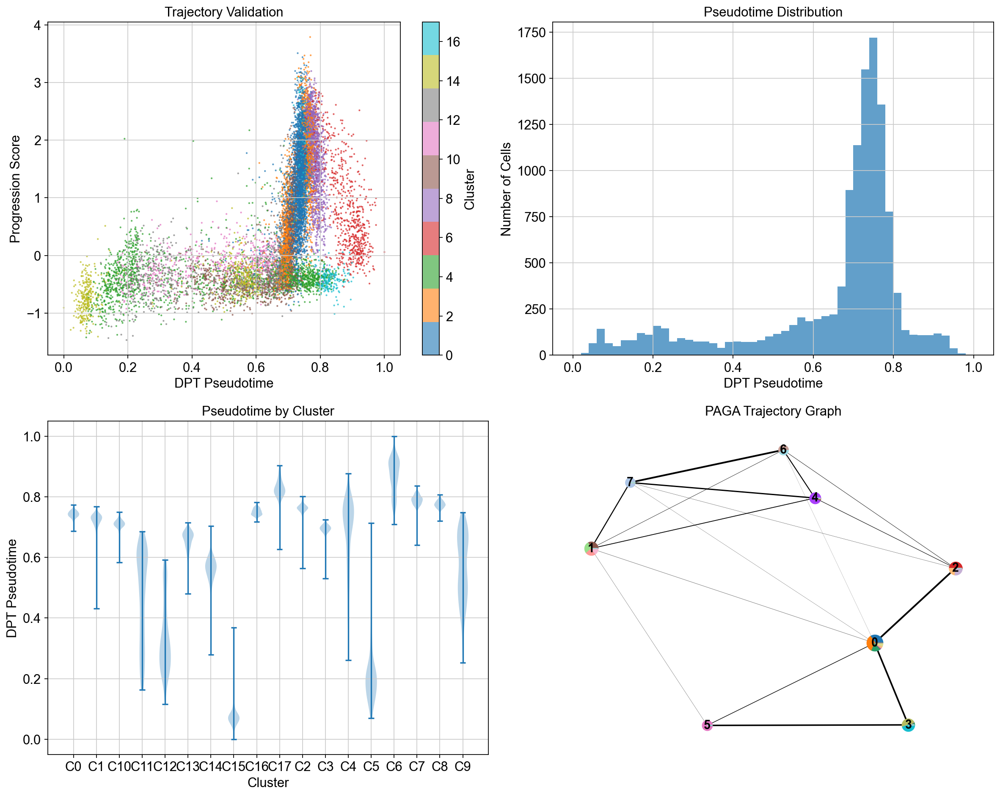


ANALYSIS SUMMARY
Final data: 12315 cells × 22037 features
Clusters identified: 18
Annotated clusters: 18
Pseudotime range: 0.000 - 1.000
GSEA databases: 1


In [5]:

SA = SpermatogenesisAnalyzer(data_path=path,
                             output_dir='58_GSEA_soupX')
cdata = SA.run_complete_analysis()